In [1]:
import holopy as hp
from holopy.scattering import Scatterer, Sphere, calc_holo
from holopy.scattering.scatterer import Indicators
import numpy as np
import matplotlib
from matplotlib import pyplot as plt
import pandas as pd
import json
from pylorenzmie.theory import coordinates, LMHologram
from pylorenzmie.analysis.Feature import Feature
from holopy.scattering.theory import DDA

In [2]:
font = {'size'   : 16}

matplotlib.rc('font', **font)

In [3]:
#Instrument parameters:
wv = 0.447
mag = 0.120
n_m = 1.34 #assume water

In [7]:
def DDA_sphere(a_p, n_p, z_p):
    detector = hp.detector_grid(200, mag)
    center = (mag*100, mag*100, z_p)
    sphere = Sphere(r = a_p, center = (0, 0, 0))

    dda = DDA()
    spacing = dda.required_spacing(wv, n_m, n_p)
    
    indicators_sphere = Indicators([sphere.contains], 
                                   [[-a_p, a_p], [-a_p, a_p], [-a_p, a_p]])
    
    sphere_scatterer = Scatterer(indicators_sphere,
                     n_p, center)
    
    holo = np.squeeze(calc_holo(detector, sphere_scatterer, medium_index=n_m, illum_wavelen=wv, illum_polarization=(1, 0)
                                , theory = dda
                               ).data)
    
    return holo

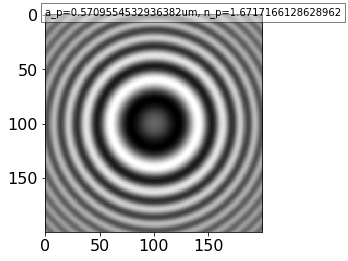

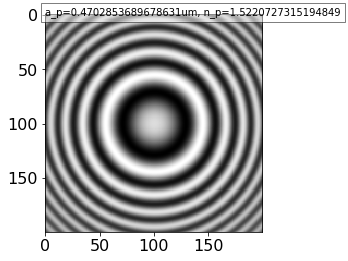

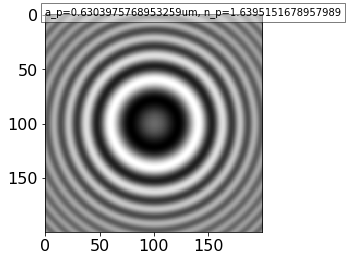

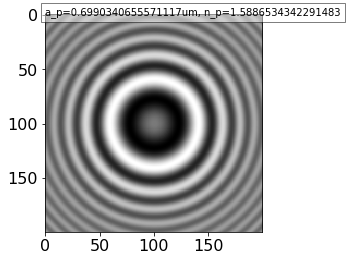

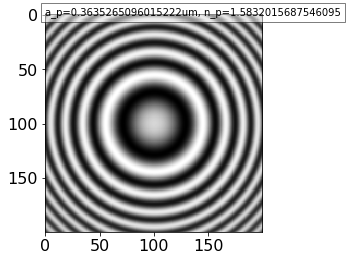

...

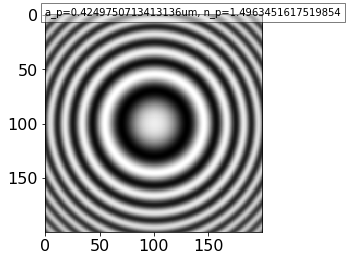

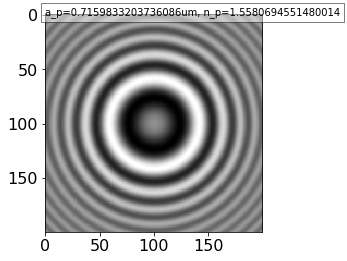

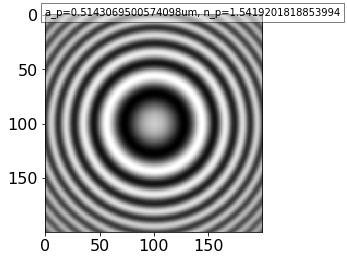

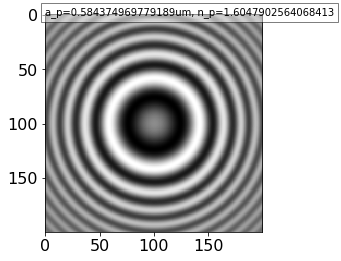

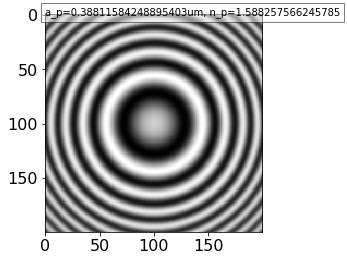

In [36]:
z_p = 50 #um

a_p_range = [0.2, 0.8]
n_p_range = [1.4, 1.7]

num_to_sample = 100

samples = {'z_p': z_p, 'a_p': [], 'n_p': [], 'data': []}

for i in range(num_to_sample):
    a_p = np.random.uniform(low=a_p_range[0], high=a_p_range[1])
    n_p = np.random.uniform(low=n_p_range[0], high=n_p_range[1])
    data = DDA_sphere(a_p, n_p, z_p)
    plt.imshow(data, cmap='gray')
    plt.text(0,0,'a_p={}um, n_p={}'.format(a_p, n_p), bbox=dict(facecolor='white', alpha=0.5), fontsize=10)
    plt.show()
    samples['a_p'].append(a_p)
    samples['n_p'].append(n_p)
    samples['data'].append(data.tolist())
    
    print(i, ' completed', end='\r')

Set up pylorenzmie fitting pipeline

FastSphere(a_p=1.0, n_p=1.5, k_p=0.0, r_p=[100.         100.         416.66666667])
[1.02583947 1.05456868 1.06951127 ... 1.04493093 1.06612309 1.06955201]


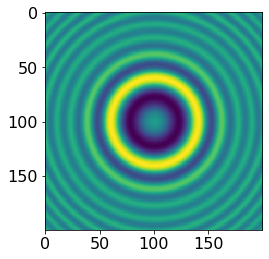

In [37]:
feature = Feature(model=LMHologram())
shape = [200, 200]
feature.model.coordinates = coordinates(shape, dtype=np.float32)
ins = feature.model.instrument
ins.wavelength = wv
ins.magnification = mag
ins.n_m = n_m

p = feature.model.particle
p.r_p = [shape[0]//2, shape[1]//2, z_p/mag]
print(p)

h = feature.model.hologram()
print(h)
plt.imshow(h.reshape(shape))

feature.optimizer.mask.settings['distribution'] = 'fast'
feature.optimizer.mask.settings['percentpix'] = .1
feature.model.coordinates = coordinates(shape, dtype=np.float32)
feature.model.double_precision = False

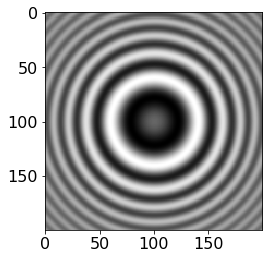

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.002336617994415312
nfev: 35
x_p: 99.96696 (init: 100.00000)
y_p: 99.97090 (init: 100.00000)
z_p: 416.13039 (init: 416.66667)
a_p: 0.55693 (init: 0.57096)
n_p: 1.67525 (init: 1.67172)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



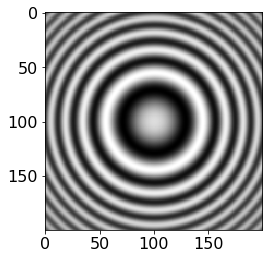

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.00041331369615331214
nfev: 19
x_p: 99.88067 (init: 100.00000)
y_p: 99.88109 (init: 100.00000)
z_p: 416.73432 (init: 416.66667)
a_p: 0.47383 (init: 0.47029)
n_p: 1.51651 (init: 1.52207)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



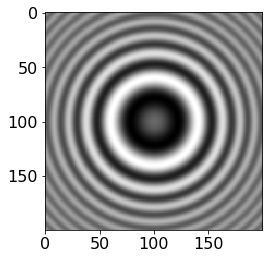

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0041059405972450275
nfev: 41
x_p: 99.91344 (init: 100.00000)
y_p: 99.91816 (init: 100.00000)
z_p: 416.16393 (init: 416.66667)
a_p: 0.61423 (init: 0.63040)
n_p: 1.64277 (init: 1.63952)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



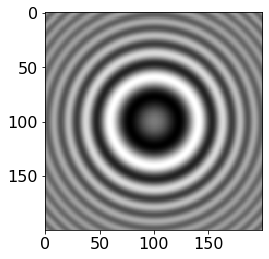

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.005344029873749243
nfev: 35
x_p: 99.84793 (init: 100.00000)
y_p: 99.85216 (init: 100.00000)
z_p: 415.11901 (init: 416.66667)
a_p: 0.68149 (init: 0.69903)
n_p: 1.58703 (init: 1.58865)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



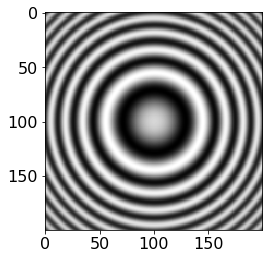

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0002046183649351038
nfev: 19
x_p: 99.85491 (init: 100.00000)
y_p: 99.85541 (init: 100.00000)
z_p: 416.77084 (init: 416.66667)
a_p: 0.36566 (init: 0.36353)
n_p: 1.57794 (init: 1.58320)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



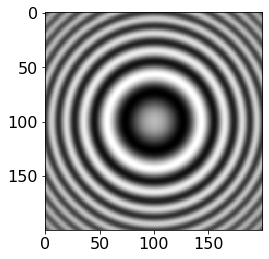

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0005817886848776441
nfev: 25
x_p: 99.79914 (init: 100.00000)
y_p: 99.80219 (init: 100.00000)
z_p: 416.68128 (init: 416.66667)
a_p: 0.50289 (init: 0.50159)
n_p: 1.56757 (init: 1.57323)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



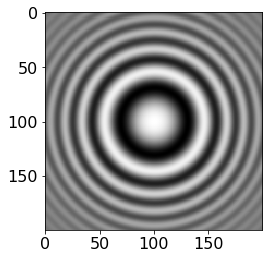

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `xtol` termination condition is satisfied.
redchi: 0.002017225372432588
nfev: 27
x_p: 99.91549 (init: 100.00000)
y_p: 99.91934 (init: 100.00000)
z_p: 416.85991 (init: 416.66667)
a_p: 0.74282 (init: 0.73440)
n_p: 1.40837 (init: 1.41112)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



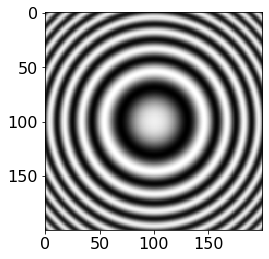

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 3.6204874312746294e-05
nfev: 19
x_p: 99.81957 (init: 100.00000)
y_p: 99.82119 (init: 100.00000)
z_p: 416.83688 (init: 416.66667)
a_p: 0.24862 (init: 0.24719)
n_p: 1.57162 (init: 1.57615)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



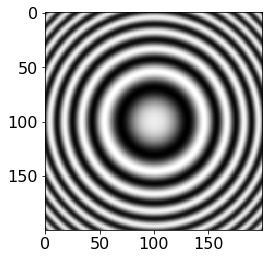

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 3.912681350773207e-05
nfev: 19
x_p: 99.83076 (init: 100.00000)
y_p: 99.83427 (init: 100.00000)
z_p: 416.82619 (init: 416.66667)
a_p: 0.24892 (init: 0.24757)
n_p: 1.57996 (init: 1.58424)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



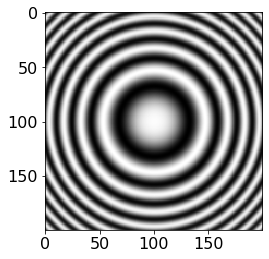

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 7.005424141213174e-06
nfev: 19
x_p: 99.82758 (init: 100.00000)
y_p: 99.82650 (init: 100.00000)
z_p: 416.86965 (init: 416.66667)
a_p: 0.20092 (init: 0.20037)
n_p: 1.50790 (init: 1.50992)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



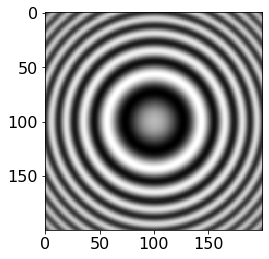

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0003865874172007598
nfev: 19
x_p: 99.79871 (init: 100.00000)
y_p: 99.79910 (init: 100.00000)
z_p: 416.74939 (init: 416.66667)
a_p: 0.43548 (init: 0.43421)
n_p: 1.60141 (init: 1.60705)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



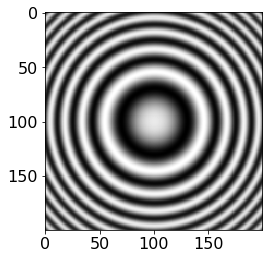

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 7.158865118841899e-05
nfev: 19
x_p: 99.92829 (init: 100.00000)
y_p: 99.92893 (init: 100.00000)
z_p: 416.71993 (init: 416.66667)
a_p: 0.29266 (init: 0.29053)
n_p: 1.56021 (init: 1.56500)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



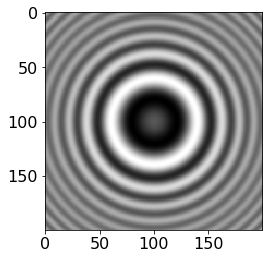

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0024071020496877083
nfev: 31
x_p: 99.80842 (init: 100.00000)
y_p: 99.80514 (init: 100.00000)
z_p: 418.19583 (init: 416.66667)
a_p: 0.62721 (init: 0.62395)
n_p: 1.68798 (init: 1.68870)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



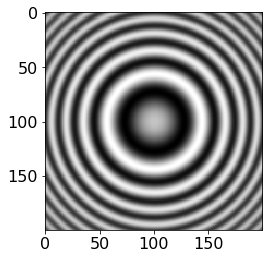

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.00034940042922321576
nfev: 19
x_p: 99.98786 (init: 100.00000)
y_p: 99.98926 (init: 100.00000)
z_p: 416.59813 (init: 416.66667)
a_p: 0.43791 (init: 0.43582)
n_p: 1.57734 (init: 1.58301)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



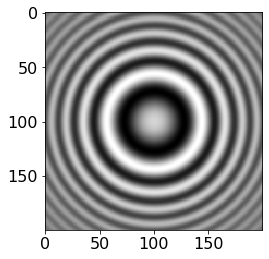

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.00120258299506183
nfev: 37
x_p: 99.79138 (init: 100.00000)
y_p: 99.79117 (init: 100.00000)
z_p: 416.62066 (init: 416.66667)
a_p: 0.65211 (init: 0.64726)
n_p: 1.48876 (init: 1.49484)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



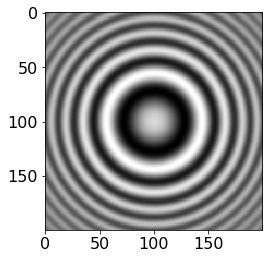

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0009580987008063245
nfev: 29
x_p: 99.77846 (init: 100.00000)
y_p: 99.77848 (init: 100.00000)
z_p: 416.71764 (init: 416.66667)
a_p: 0.62097 (init: 0.61578)
n_p: 1.48894 (init: 1.49477)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



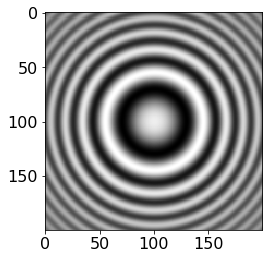

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0006978446357096503
nfev: 19
x_p: 99.90830 (init: 100.00000)
y_p: 99.90892 (init: 100.00000)
z_p: 416.73306 (init: 416.66667)
a_p: 0.58956 (init: 0.58245)
n_p: 1.46282 (init: 1.46800)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



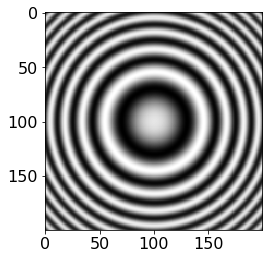

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 6.680740710044518e-05
nfev: 19
x_p: 99.85072 (init: 100.00000)
y_p: 99.85075 (init: 100.00000)
z_p: 416.80563 (init: 416.66667)
a_p: 0.27775 (init: 0.27630)
n_p: 1.59027 (init: 1.59522)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



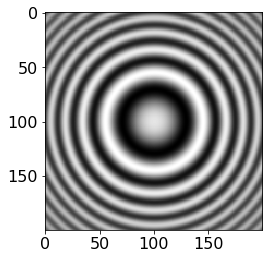

FIT REPORT
---------------------------------------------
method: lm
success: True
message: Both `ftol` and `xtol` termination conditions are satisfied.
redchi: 0.00047378208504437764
nfev: 37
x_p: 99.87188 (init: 100.00000)
y_p: 99.87495 (init: 100.00000)
z_p: 416.77924 (init: 416.66667)
a_p: 0.51196 (init: 0.50761)
n_p: 1.49045 (init: 1.49567)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



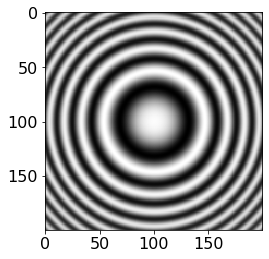

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 6.115852654511286e-05
nfev: 19
x_p: 99.91399 (init: 100.00000)
y_p: 99.91603 (init: 100.00000)
z_p: 416.78456 (init: 416.66667)
a_p: 0.34436 (init: 0.34118)
n_p: 1.45958 (init: 1.46313)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



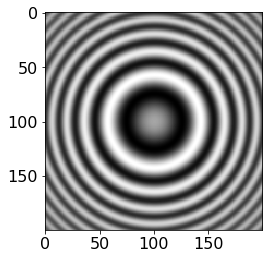

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.00046926613258895943
nfev: 25
x_p: 99.89680 (init: 100.00000)
y_p: 99.89771 (init: 100.00000)
z_p: 416.59642 (init: 416.66667)
a_p: 0.46992 (init: 0.47007)
n_p: 1.61509 (init: 1.62048)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



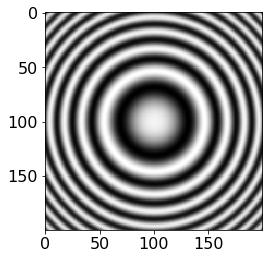

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 3.5706023862381174e-05
nfev: 19
x_p: 99.89209 (init: 100.00000)
y_p: 99.89171 (init: 100.00000)
z_p: 416.77259 (init: 416.66667)
a_p: 0.26488 (init: 0.26338)
n_p: 1.52938 (init: 1.53394)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



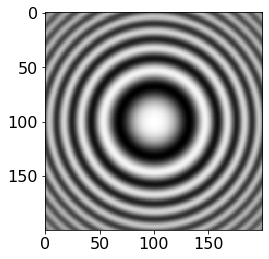

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.00020344227857649013
nfev: 34
x_p: 99.84994 (init: 100.00000)
y_p: 99.84921 (init: 100.00000)
z_p: 417.06364 (init: 416.66667)
a_p: 0.54685 (init: 0.54015)
n_p: 1.39852 (init: 1.40046)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



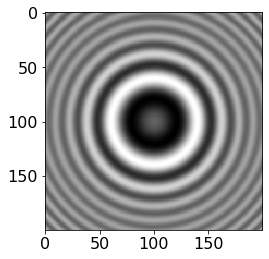

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.009835685249348164
nfev: 42
x_p: 99.81360 (init: 100.00000)
y_p: 99.80912 (init: 100.00000)
z_p: 418.69544 (init: 416.66667)
a_p: 0.74178 (init: 0.73724)
n_p: 1.61474 (init: 1.61520)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



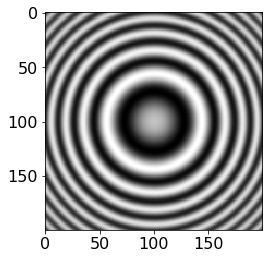

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.00023872176665355632
nfev: 19
x_p: 99.81307 (init: 100.00000)
y_p: 99.81426 (init: 100.00000)
z_p: 416.79638 (init: 416.66667)
a_p: 0.37799 (init: 0.37657)
n_p: 1.61689 (init: 1.62214)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



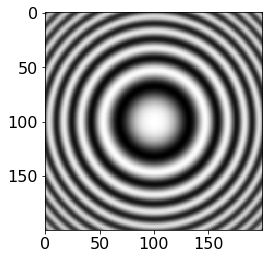

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 6.905334588280423e-05
nfev: 25
x_p: 99.78910 (init: 100.00000)
y_p: 99.79011 (init: 100.00000)
z_p: 416.97178 (init: 416.66667)
a_p: 0.40503 (init: 0.39953)
n_p: 1.41743 (init: 1.42028)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



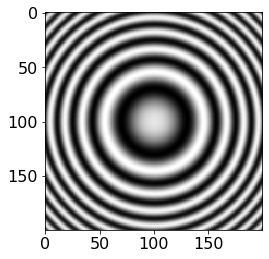

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 2.5654529788775887e-05
nfev: 19
x_p: 99.85277 (init: 100.00000)
y_p: 99.85570 (init: 100.00000)
z_p: 416.80442 (init: 416.66667)
a_p: 0.20826 (init: 0.20799)
n_p: 1.67665 (init: 1.68227)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



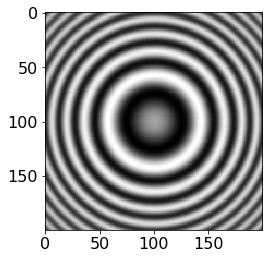

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0003019917298424178
nfev: 19
x_p: 99.88309 (init: 100.00000)
y_p: 99.88532 (init: 100.00000)
z_p: 416.68918 (init: 416.66667)
a_p: 0.40028 (init: 0.40023)
n_p: 1.66796 (init: 1.67292)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



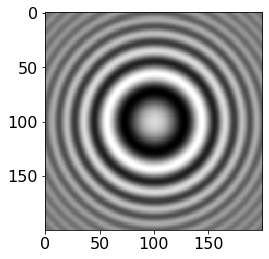

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0025312532505725903
nfev: 19
x_p: 99.97328 (init: 100.00000)
y_p: 99.97507 (init: 100.00000)
z_p: 416.21256 (init: 416.66667)
a_p: 0.74184 (init: 0.73722)
n_p: 1.47281 (init: 1.47903)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



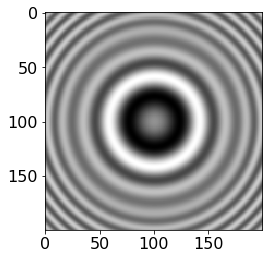

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.01160095414576859
nfev: 28
x_p: 99.98286 (init: 100.00000)
y_p: 99.98118 (init: 100.00000)
z_p: 418.51208 (init: 416.66667)
a_p: 0.76518 (init: 0.77494)
n_p: 1.70427 (init: 1.69744)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



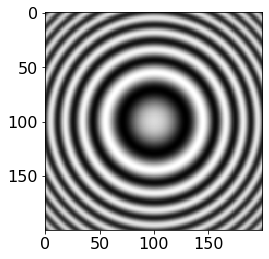

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0001849296805079796
nfev: 19
x_p: 99.78896 (init: 100.00000)
y_p: 99.79105 (init: 100.00000)
z_p: 416.82586 (init: 416.66667)
a_p: 0.36013 (init: 0.35779)
n_p: 1.57150 (init: 1.57680)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



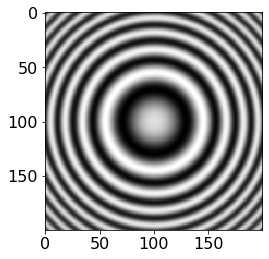

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.00014830240568220146
nfev: 19
x_p: 99.89816 (init: 100.00000)
y_p: 99.89949 (init: 100.00000)
z_p: 416.74731 (init: 416.66667)
a_p: 0.34528 (init: 0.34338)
n_p: 1.56434 (init: 1.56985)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



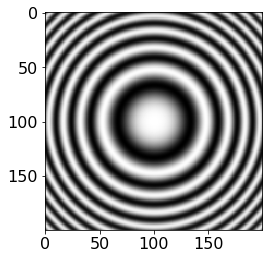

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 2.190716407967807e-06
nfev: 25
x_p: 99.82225 (init: 100.00000)
y_p: 99.82277 (init: 100.00000)
z_p: 416.90919 (init: 416.66667)
a_p: 0.21513 (init: 0.21476)
n_p: 1.41287 (init: 1.41383)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



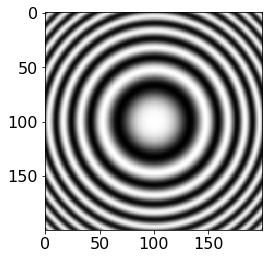

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 2.819000397341349e-06
nfev: 19
x_p: 99.76392 (init: 100.00000)
y_p: 99.76546 (init: 100.00000)
z_p: 416.93528 (init: 416.66667)
a_p: 0.20400 (init: 0.20363)
n_p: 1.43827 (init: 1.44053)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



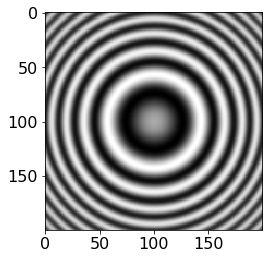

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.00021964880995313722
nfev: 25
x_p: 99.80887 (init: 100.00000)
y_p: 99.81174 (init: 100.00000)
z_p: 416.78969 (init: 416.66667)
a_p: 0.35998 (init: 0.35920)
n_p: 1.68805 (init: 1.69395)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



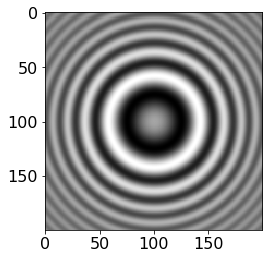

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0012584302213364158
nfev: 25
x_p: 99.96927 (init: 100.00000)
y_p: 99.97261 (init: 100.00000)
z_p: 415.75232 (init: 416.66667)
a_p: 0.67323 (init: 0.67658)
n_p: 1.53822 (init: 1.54451)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



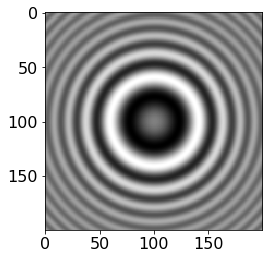

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.005786931512965224
nfev: 35
x_p: 99.95571 (init: 100.00000)
y_p: 99.95933 (init: 100.00000)
z_p: 416.19415 (init: 416.66667)
a_p: 0.70941 (init: 0.71731)
n_p: 1.57453 (init: 1.57705)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



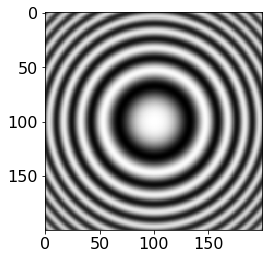

FIT REPORT
---------------------------------------------
method: lm
success: True
message: Both `ftol` and `xtol` termination conditions are satisfied.
redchi: 4.013813959454808e-05
nfev: 39
x_p: 99.85938 (init: 100.00000)
y_p: 99.85886 (init: 100.00000)
z_p: 416.88170 (init: 416.66667)
a_p: 0.38315 (init: 0.37805)
n_p: 1.40772 (init: 1.41048)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



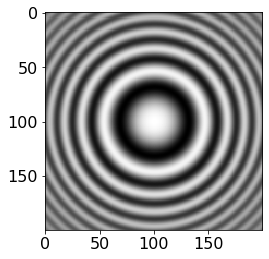

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.00038885179344411635
nfev: 19
x_p: 99.97869 (init: 100.00000)
y_p: 99.98269 (init: 100.00000)
z_p: 416.96100 (init: 416.66667)
a_p: 0.59099 (init: 0.58429)
n_p: 1.40685 (init: 1.40901)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



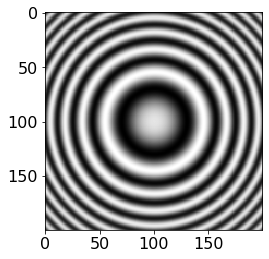

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 8.012916857688801e-05
nfev: 19
x_p: 99.93561 (init: 100.00000)
y_p: 99.93553 (init: 100.00000)
z_p: 416.72461 (init: 416.66667)
a_p: 0.28906 (init: 0.28737)
n_p: 1.58392 (init: 1.58859)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



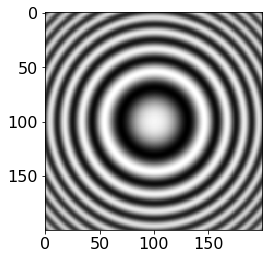

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0001604294150070587
nfev: 19
x_p: 99.96606 (init: 100.00000)
y_p: 99.96581 (init: 100.00000)
z_p: 416.70428 (init: 416.66667)
a_p: 0.40891 (init: 0.40452)
n_p: 1.47060 (init: 1.47512)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



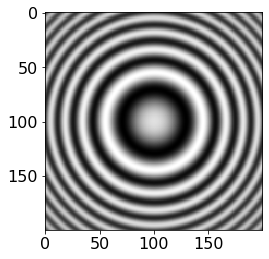

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.00029570413057585605
nfev: 31
x_p: 99.78597 (init: 100.00000)
y_p: 99.78822 (init: 100.00000)
z_p: 416.82918 (init: 416.66667)
a_p: 0.43116 (init: 0.42727)
n_p: 1.52397 (init: 1.52951)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



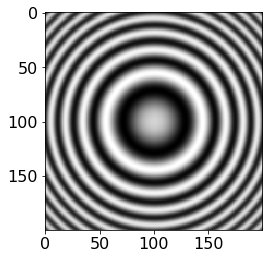

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.00014740168050990049
nfev: 19
x_p: 99.85641 (init: 100.00000)
y_p: 99.85578 (init: 100.00000)
z_p: 416.78221 (init: 416.66667)
a_p: 0.32932 (init: 0.32757)
n_p: 1.61050 (init: 1.61606)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



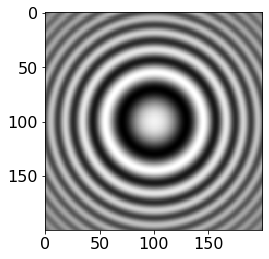

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0009442985291820946
nfev: 56
x_p: 99.89431 (init: 100.00000)
y_p: 99.89684 (init: 100.00000)
z_p: 416.81043 (init: 416.66667)
a_p: 0.62282 (init: 0.61565)
n_p: 1.45409 (init: 1.45857)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



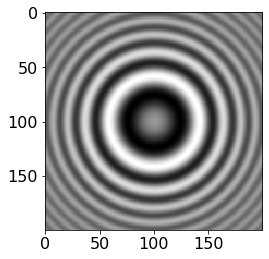

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0016533258328279138
nfev: 38
x_p: 99.80494 (init: 100.00000)
y_p: 99.80455 (init: 100.00000)
z_p: 415.82007 (init: 416.66667)
a_p: 0.67274 (init: 0.67819)
n_p: 1.55330 (init: 1.55908)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



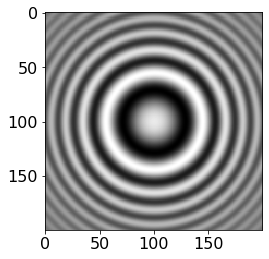

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0015050450620906395
nfev: 19
x_p: 99.85242 (init: 100.00000)
y_p: 99.85166 (init: 100.00000)
z_p: 416.70913 (init: 416.66667)
a_p: 0.67454 (init: 0.66789)
n_p: 1.46088 (init: 1.46609)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



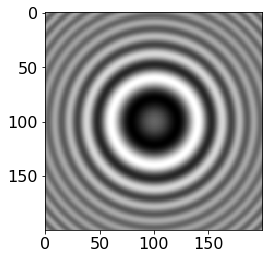

FIT REPORT
---------------------------------------------
method: lm
success: True
message: Both `ftol` and `xtol` termination conditions are satisfied.
redchi: 0.00740064952615168
nfev: 45
x_p: 99.93432 (init: 100.00000)
y_p: 99.93438 (init: 100.00000)
z_p: 417.09958 (init: 416.66667)
a_p: 0.68929 (init: 0.69300)
n_p: 1.62641 (init: 1.62622)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



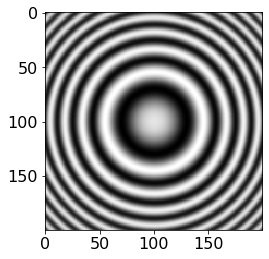

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 9.150750121206259e-05
nfev: 19
x_p: 99.80903 (init: 100.00000)
y_p: 99.81128 (init: 100.00000)
z_p: 416.84628 (init: 416.66667)
a_p: 0.30376 (init: 0.30237)
n_p: 1.57383 (init: 1.57868)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



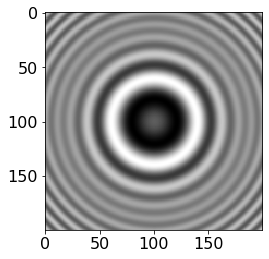

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.004841379717430222
nfev: 35
x_p: 99.91503 (init: 100.00000)
y_p: 99.91267 (init: 100.00000)
z_p: 418.76330 (init: 416.66667)
a_p: 0.72553 (init: 0.72412)
n_p: 1.67203 (init: 1.67069)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



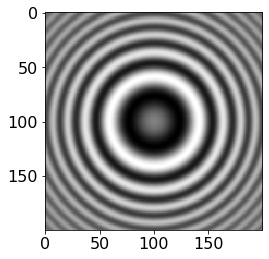

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.001089451227731044
nfev: 19
x_p: 99.79448 (init: 100.00000)
y_p: 99.79328 (init: 100.00000)
z_p: 416.43187 (init: 416.66667)
a_p: 0.55760 (init: 0.56328)
n_p: 1.62863 (init: 1.63177)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



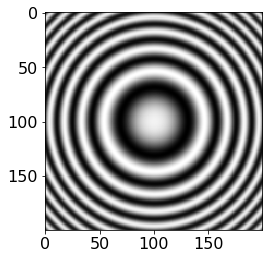

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 2.161280735627384e-05
nfev: 19
x_p: 99.85277 (init: 100.00000)
y_p: 99.85329 (init: 100.00000)
z_p: 416.82962 (init: 416.66667)
a_p: 0.22308 (init: 0.22180)
n_p: 1.57567 (init: 1.57970)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



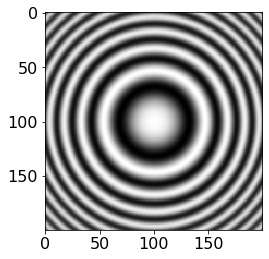

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 5.2911014204730717e-05
nfev: 25
x_p: 99.93696 (init: 100.00000)
y_p: 99.93709 (init: 100.00000)
z_p: 416.74752 (init: 416.66667)
a_p: 0.35214 (init: 0.34756)
n_p: 1.44462 (init: 1.44845)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



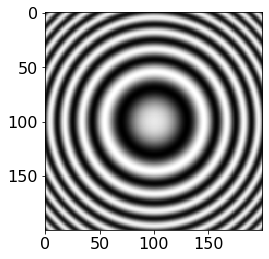

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 2.7117384840320037e-05
nfev: 25
x_p: 99.86713 (init: 100.00000)
y_p: 99.86633 (init: 100.00000)
z_p: 416.81395 (init: 416.66667)
a_p: 0.21343 (init: 0.21242)
n_p: 1.65406 (init: 1.65963)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



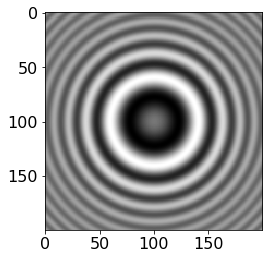

FIT REPORT
---------------------------------------------
method: lm
success: True
message: Both `ftol` and `xtol` termination conditions are satisfied.
redchi: 0.005697946254629295
nfev: 41
x_p: 99.84100 (init: 100.00000)
y_p: 99.84301 (init: 100.00000)
z_p: 415.87587 (init: 416.66667)
a_p: 0.68089 (init: 0.69535)
n_p: 1.59463 (init: 1.59491)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



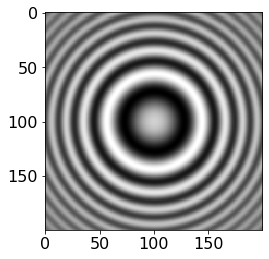

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0008293583417992367
nfev: 19
x_p: 99.92934 (init: 100.00000)
y_p: 99.92938 (init: 100.00000)
z_p: 416.49590 (init: 416.66667)
a_p: 0.60250 (init: 0.59830)
n_p: 1.50343 (init: 1.50952)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



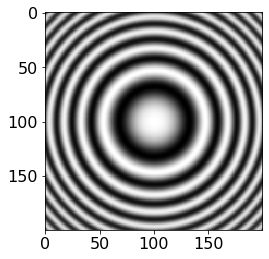

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 3.480037011132801e-05
nfev: 37
x_p: 99.94388 (init: 100.00000)
y_p: 99.94741 (init: 100.00000)
z_p: 416.75984 (init: 416.66667)
a_p: 0.32069 (init: 0.31739)
n_p: 1.44225 (init: 1.44552)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



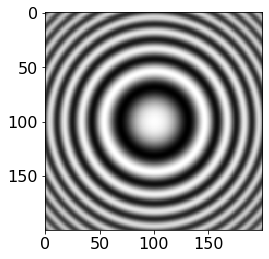

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0001601688251252482
nfev: 19
x_p: 99.95509 (init: 100.00000)
y_p: 99.95486 (init: 100.00000)
z_p: 416.75764 (init: 416.66667)
a_p: 0.44859 (init: 0.44265)
n_p: 1.44142 (init: 1.44540)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



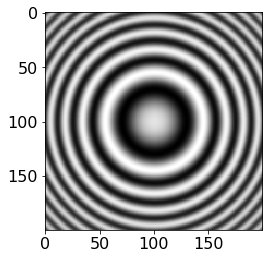

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.00019674835562363057
nfev: 19
x_p: 99.91107 (init: 100.00000)
y_p: 99.91284 (init: 100.00000)
z_p: 416.71787 (init: 416.66667)
a_p: 0.38480 (init: 0.38166)
n_p: 1.53318 (init: 1.53837)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



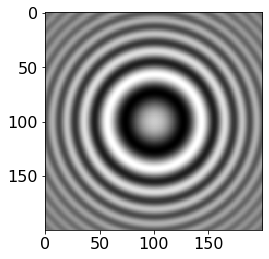

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0015527207461749082
nfev: 19
x_p: 99.98795 (init: 100.00000)
y_p: 99.98834 (init: 100.00000)
z_p: 416.12181 (init: 416.66667)
a_p: 0.70175 (init: 0.69938)
n_p: 1.49269 (init: 1.49908)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



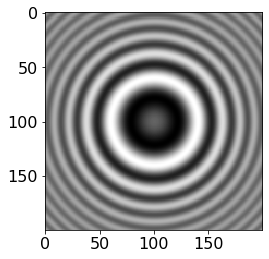

FIT REPORT
---------------------------------------------
method: lm
success: True
message: Both `ftol` and `xtol` termination conditions are satisfied.
redchi: 0.0048970004892632145
nfev: 34
x_p: 99.95825 (init: 100.00000)
y_p: 99.96018 (init: 100.00000)
z_p: 416.77243 (init: 416.66667)
a_p: 0.62658 (init: 0.63232)
n_p: 1.64947 (init: 1.64885)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



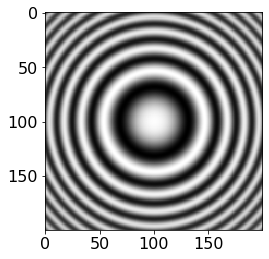

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 9.658070630810822e-05
nfev: 19
x_p: 99.79540 (init: 100.00000)
y_p: 99.79611 (init: 100.00000)
z_p: 416.89945 (init: 416.66667)
a_p: 0.39687 (init: 0.39156)
n_p: 1.44659 (init: 1.45065)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



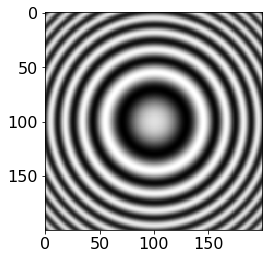

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0001148330056750435
nfev: 19
x_p: 99.94109 (init: 100.00000)
y_p: 99.94139 (init: 100.00000)
z_p: 416.68539 (init: 416.66667)
a_p: 0.31878 (init: 0.31696)
n_p: 1.58212 (init: 1.58708)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



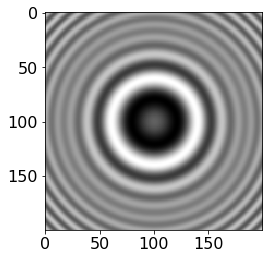

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.006150523014754656
nfev: 36
x_p: 99.94243 (init: 100.00000)
y_p: 99.95111 (init: 100.00000)
z_p: 418.36496 (init: 416.66667)
a_p: 0.72762 (init: 0.72958)
n_p: 1.67369 (init: 1.67105)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



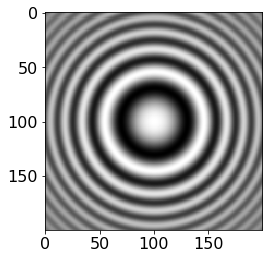

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0008636025575071997
nfev: 27
x_p: 99.88959 (init: 100.00000)
y_p: 99.88922 (init: 100.00000)
z_p: 416.94921 (init: 416.66667)
a_p: 0.63297 (init: 0.62542)
n_p: 1.43073 (init: 1.43419)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



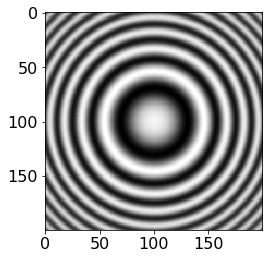

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.00013016335601642528
nfev: 19
x_p: 99.77001 (init: 100.00000)
y_p: 99.77222 (init: 100.00000)
z_p: 416.87896 (init: 416.66667)
a_p: 0.38242 (init: 0.37827)
n_p: 1.48324 (init: 1.48813)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



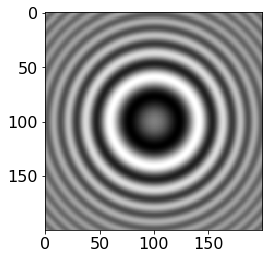

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.003313061604851993
nfev: 23
x_p: 99.90985 (init: 100.00000)
y_p: 99.90747 (init: 100.00000)
z_p: 415.79078 (init: 416.66667)
a_p: 0.66657 (init: 0.67745)
n_p: 1.58767 (init: 1.59015)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



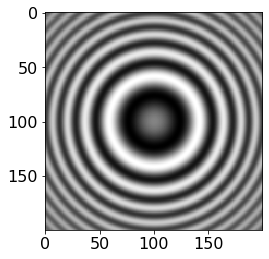

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0006132403288411518
nfev: 27
x_p: 99.80097 (init: 100.00000)
y_p: 99.80300 (init: 100.00000)
z_p: 416.65045 (init: 416.66667)
a_p: 0.49796 (init: 0.50060)
n_p: 1.65656 (init: 1.66048)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



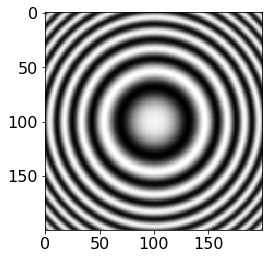

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 1.5745698372183108e-05
nfev: 31
x_p: 99.95274 (init: 100.00000)
y_p: 99.95587 (init: 100.00000)
z_p: 416.71012 (init: 416.66667)
a_p: 0.20771 (init: 0.20652)
n_p: 1.57438 (init: 1.57863)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



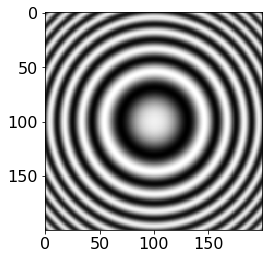

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 4.07049429888664e-05
nfev: 25
x_p: 99.90206 (init: 100.00000)
y_p: 99.90271 (init: 100.00000)
z_p: 416.76341 (init: 416.66667)
a_p: 0.26134 (init: 0.26010)
n_p: 1.55484 (init: 1.55919)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



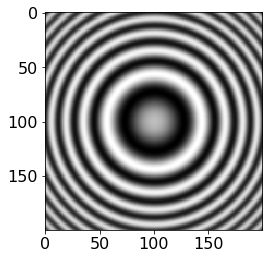

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.00021590053163362107
nfev: 19
x_p: 99.91300 (init: 100.00000)
y_p: 99.91660 (init: 100.00000)
z_p: 416.70387 (init: 416.66667)
a_p: 0.35671 (init: 0.35520)
n_p: 1.64393 (init: 1.64936)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



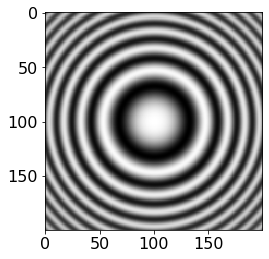

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `xtol` termination condition is satisfied.
redchi: 6.376387986346344e-05
nfev: 26
x_p: 99.90081 (init: 100.00000)
y_p: 99.90041 (init: 100.00000)
z_p: 416.86931 (init: 416.66667)
a_p: 0.42146 (init: 0.41566)
n_p: 1.40626 (init: 1.40881)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



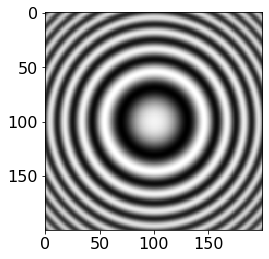

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0001531433526449316
nfev: 19
x_p: 99.92086 (init: 100.00000)
y_p: 99.91969 (init: 100.00000)
z_p: 416.73139 (init: 416.66667)
a_p: 0.40095 (init: 0.39642)
n_p: 1.48078 (init: 1.48560)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



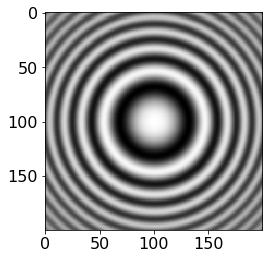

FIT REPORT
---------------------------------------------
method: lm
success: True
message: Both `ftol` and `xtol` termination conditions are satisfied.
redchi: 0.0002825391677346988
nfev: 40
x_p: 99.95947 (init: 100.00000)
y_p: 99.95989 (init: 100.00000)
z_p: 416.94247 (init: 416.66667)
a_p: 0.55629 (init: 0.54930)
n_p: 1.40906 (init: 1.41143)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



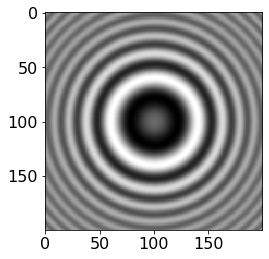

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.004775868871115876
nfev: 22
x_p: 99.92833 (init: 100.00000)
y_p: 99.93274 (init: 100.00000)
z_p: 416.14626 (init: 416.66667)
a_p: 0.65553 (init: 0.66619)
n_p: 1.62400 (init: 1.62375)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



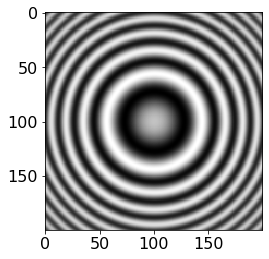

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0002774011583036052
nfev: 19
x_p: 99.87236 (init: 100.00000)
y_p: 99.87239 (init: 100.00000)
z_p: 416.75368 (init: 416.66667)
a_p: 0.38800 (init: 0.38604)
n_p: 1.60979 (init: 1.61605)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



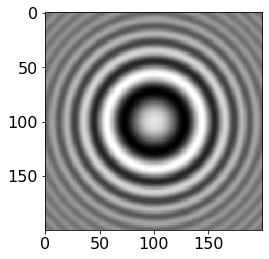

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0049685400462733875
nfev: 30
x_p: 99.90565 (init: 100.00000)
y_p: 99.90535 (init: 100.00000)
z_p: 416.42432 (init: 416.66667)
a_p: 0.80420 (init: 0.79901)
n_p: 1.45535 (init: 1.46086)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



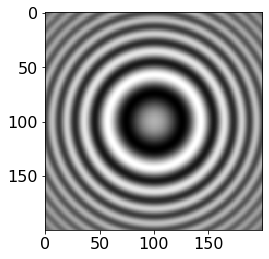

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0007910912963793509
nfev: 19
x_p: 99.80438 (init: 100.00000)
y_p: 99.80243 (init: 100.00000)
z_p: 416.43371 (init: 416.66667)
a_p: 0.59464 (init: 0.59457)
n_p: 1.54720 (init: 1.55340)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



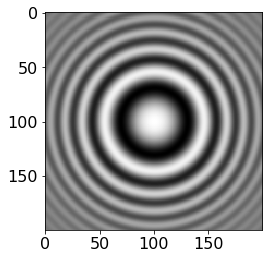

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `xtol` termination condition is satisfied.
redchi: 0.002070494598519169
nfev: 23
x_p: 99.94819 (init: 100.00000)
y_p: 99.94768 (init: 100.00000)
z_p: 417.00746 (init: 416.66667)
a_p: 0.74454 (init: 0.73645)
n_p: 1.41078 (init: 1.41341)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



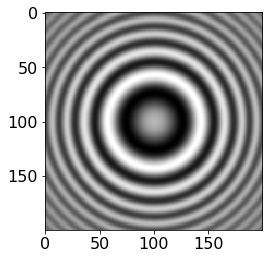

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0008763123881404904
nfev: 25
x_p: 99.92090 (init: 100.00000)
y_p: 99.92317 (init: 100.00000)
z_p: 416.28579 (init: 416.66667)
a_p: 0.61542 (init: 0.61461)
n_p: 1.53318 (init: 1.53951)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



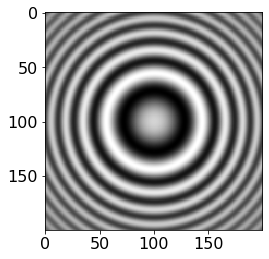

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0006193466048709601
nfev: 31
x_p: 99.76093 (init: 100.00000)
y_p: 99.76361 (init: 100.00000)
z_p: 416.77100 (init: 416.66667)
a_p: 0.54957 (init: 0.54551)
n_p: 1.51146 (init: 1.51735)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



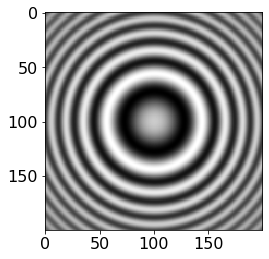

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.000578761317233264
nfev: 31
x_p: 99.86471 (init: 100.00000)
y_p: 99.86511 (init: 100.00000)
z_p: 416.66952 (init: 416.66667)
a_p: 0.52460 (init: 0.52132)
n_p: 1.53143 (init: 1.53730)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



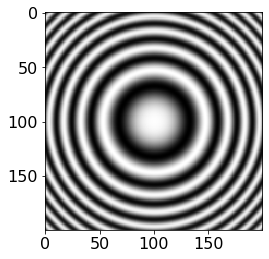

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 6.694010518047603e-06
nfev: 19
x_p: 99.86949 (init: 100.00000)
y_p: 99.86895 (init: 100.00000)
z_p: 416.77982 (init: 416.66667)
a_p: 0.20978 (init: 0.20952)
n_p: 1.47979 (init: 1.48404)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



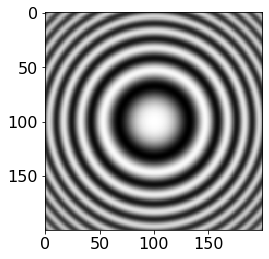

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 7.347012648991704e-05
nfev: 19
x_p: 99.77294 (init: 100.00000)
y_p: 99.77470 (init: 100.00000)
z_p: 417.00135 (init: 416.66667)
a_p: 0.43861 (init: 0.43283)
n_p: 1.40408 (init: 1.40638)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



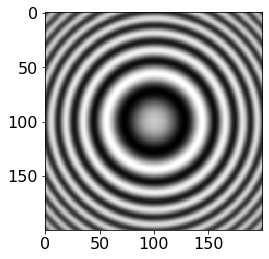

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0003199742342483572
nfev: 19
x_p: 99.84963 (init: 100.00000)
y_p: 99.84911 (init: 100.00000)
z_p: 416.74434 (init: 416.66667)
a_p: 0.42150 (init: 0.41937)
n_p: 1.57791 (init: 1.58330)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



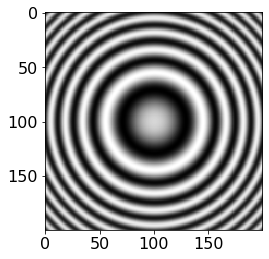

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 8.076180111768454e-05
nfev: 19
x_p: 99.89927 (init: 100.00000)
y_p: 99.90049 (init: 100.00000)
z_p: 416.75908 (init: 416.66667)
a_p: 0.27127 (init: 0.26990)
n_p: 1.65577 (init: 1.66233)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



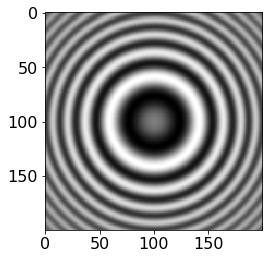

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0006803615455643121
nfev: 25
x_p: 99.83378 (init: 100.00000)
y_p: 99.83438 (init: 100.00000)
z_p: 416.59008 (init: 416.66667)
a_p: 0.49780 (init: 0.50161)
n_p: 1.66648 (init: 1.66967)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



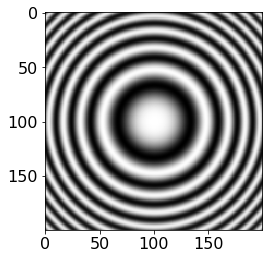

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 2.273283107666778e-06
nfev: 19
x_p: 99.87685 (init: 100.00000)
y_p: 99.87556 (init: 100.00000)
z_p: 416.82539 (init: 416.66667)
a_p: 0.22312 (init: 0.22268)
n_p: 1.40752 (init: 1.41003)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



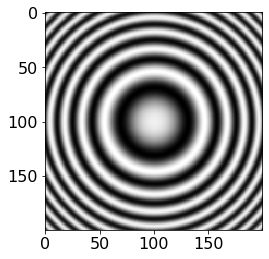

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 1.820908277543393e-05
nfev: 13
x_p: 99.99876 (init: 100.00000)
y_p: 99.99916 (init: 100.00000)
z_p: 416.67448 (init: 416.66667)
a_p: 0.20746 (init: 0.20731)
n_p: 1.61042 (init: 1.61507)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



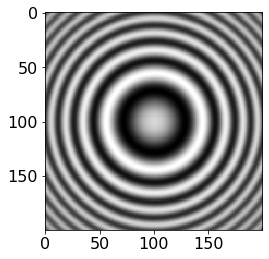

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0004337661851681855
nfev: 25
x_p: 99.96709 (init: 100.00000)
y_p: 99.96588 (init: 100.00000)
z_p: 416.61224 (init: 416.66667)
a_p: 0.48163 (init: 0.47778)
n_p: 1.52560 (init: 1.53130)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



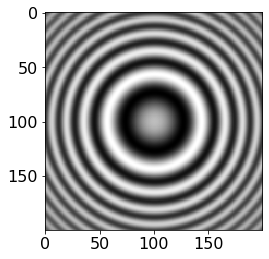

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `xtol` termination condition is satisfied.
redchi: 0.0005589501778610989
nfev: 26
x_p: 99.99215 (init: 100.00000)
y_p: 99.99102 (init: 100.00000)
z_p: 416.54188 (init: 416.66667)
a_p: 0.50037 (init: 0.49771)
n_p: 1.56203 (init: 1.56780)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



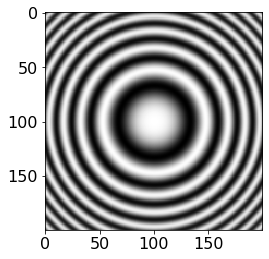

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 6.986815655158095e-06
nfev: 43
x_p: 99.91669 (init: 100.00000)
y_p: 99.91629 (init: 100.00000)
z_p: 416.82902 (init: 416.66667)
a_p: 0.25786 (init: 0.25673)
n_p: 1.42020 (init: 1.42118)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



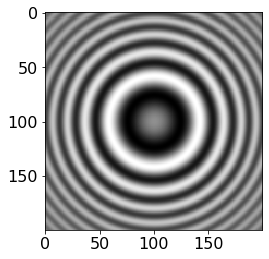

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0009182104998143124
nfev: 22
x_p: 99.87658 (init: 100.00000)
y_p: 99.87732 (init: 100.00000)
z_p: 416.38598 (init: 416.66667)
a_p: 0.54945 (init: 0.55258)
n_p: 1.60910 (init: 1.61379)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



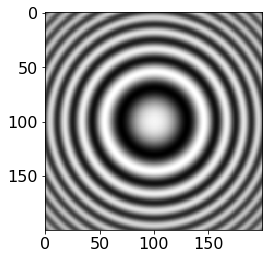

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.00028783309746460885
nfev: 26
x_p: 99.81538 (init: 100.00000)
y_p: 99.81285 (init: 100.00000)
z_p: 416.85488 (init: 416.66667)
a_p: 0.48666 (init: 0.48052)
n_p: 1.46084 (init: 1.46549)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



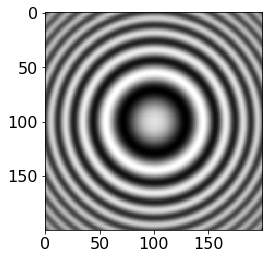

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0004979806044107921
nfev: 20
x_p: 99.93880 (init: 100.00000)
y_p: 99.94231 (init: 100.00000)
z_p: 416.65271 (init: 416.66667)
a_p: 0.51797 (init: 0.51331)
n_p: 1.49700 (init: 1.50234)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



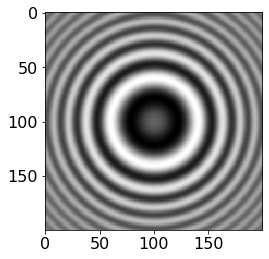

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0023369496126724384
nfev: 31
x_p: 99.93993 (init: 100.00000)
y_p: 99.94392 (init: 100.00000)
z_p: 416.25088 (init: 416.66667)
a_p: 0.55211 (init: 0.56550)
n_p: 1.68270 (init: 1.67898)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



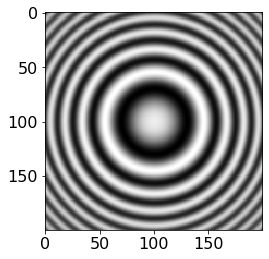

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.00022427567953326296
nfev: 19
x_p: 99.93850 (init: 100.00000)
y_p: 99.93719 (init: 100.00000)
z_p: 416.71036 (init: 416.66667)
a_p: 0.42949 (init: 0.42498)
n_p: 1.49142 (init: 1.49635)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



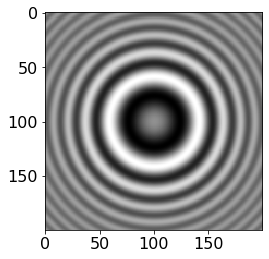

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0031922620703820352
nfev: 28
x_p: 99.87671 (init: 100.00000)
y_p: 99.87349 (init: 100.00000)
z_p: 415.48905 (init: 416.66667)
a_p: 0.70676 (init: 0.71598)
n_p: 1.55308 (init: 1.55807)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



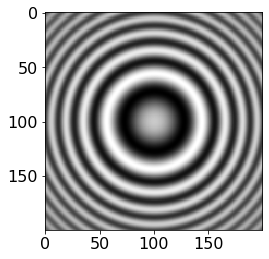

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0005693301639304282
nfev: 19
x_p: 99.81932 (init: 100.00000)
y_p: 99.82101 (init: 100.00000)
z_p: 416.71895 (init: 416.66667)
a_p: 0.51734 (init: 0.51431)
n_p: 1.53609 (init: 1.54192)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



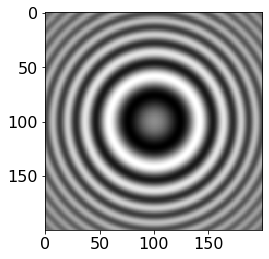

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0011189303739242591
nfev: 27
x_p: 99.87843 (init: 100.00000)
y_p: 99.88045 (init: 100.00000)
z_p: 416.21997 (init: 416.66667)
a_p: 0.57932 (init: 0.58437)
n_p: 1.60060 (init: 1.60479)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



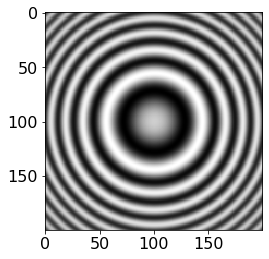

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.00024844286147537403
nfev: 19
x_p: 99.83459 (init: 100.00000)
y_p: 99.83605 (init: 100.00000)
z_p: 416.77252 (init: 416.66667)
a_p: 0.39031 (init: 0.38812)
n_p: 1.58281 (init: 1.58826)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)



In [38]:
#parameters that pylorenzmie will fit to
samples['a_p*'] = [] 
samples ['n_p*'] = []

for n in range(len(samples['data'])):
    p = feature.model.particle
    
    #fit 1:  core sphere
    p.r_p = [shape[0]//2, shape[1]//2, z_p/mag]
    p.a_p = samples['a_p'][n]
    p.n_p = samples['n_p'][n]
    
    feature.data = np.array(samples['data'][n])
    
    plt.imshow(feature.data, cmap='gray')
    plt.show()

    
    result = feature.optimize(method='lm', verbose=False)
    print(result)
    a_fit = feature.model.particle.a_p
    n_fit = feature.model.particle.n_p
    
    samples['a_p*'].append(a_fit)
    samples['n_p*'].append(n_fit)
    

In [39]:
savesamples = samples.copy()
del savesamples['data']

with open('./DDA_sphere_validation.json', 'w') as f:
    json.dump(savesamples, f)

    z_p       a_p       n_p      a_p*      n_p*
0    50  0.570955  1.671717  0.556928  1.675252
1    50  0.470285  1.522073  0.473834  1.516514
2    50  0.630398  1.639515  0.614226  1.642766
3    50  0.699034  1.588653  0.681489  1.587027
4    50  0.363527  1.583202  0.365665  1.577937
..  ...       ...       ...       ...       ...
95   50  0.424975  1.496345  0.429492  1.491417
96   50  0.715983  1.558069  0.706757  1.553083
97   50  0.514307  1.541920  0.517344  1.536091
98   50  0.584375  1.604790  0.579323  1.600597
99   50  0.388116  1.588258  0.390312  1.582808

[100 rows x 5 columns]


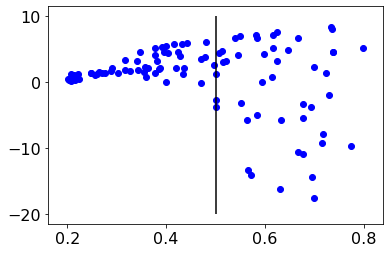

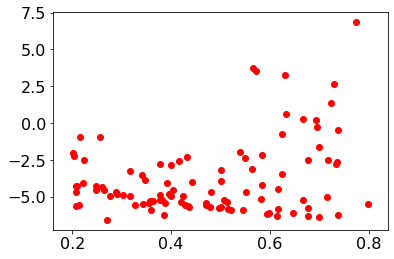

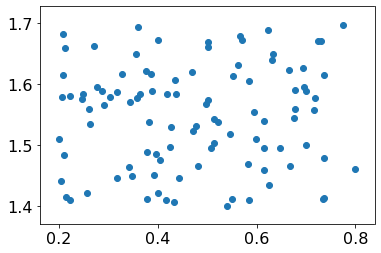

In [43]:
df = pd.DataFrame(savesamples)
print(df)

a_p = df.a_p
n_p = df.n_p

delta_a = 1e3*(df['a_p*'] - df['a_p'])
delta_n = 1e3*(df['n_p*'] - df['n_p'])

plt.scatter(a_p, delta_a, c='b')
plt.vlines(0.5, -20, 10)
plt.show()
plt.scatter(a_p, delta_n, c='r')
#ax.plot(n_1, fit_delta_a, c='r')
#ax.set_xlabel(r'Coating length $a_1$ [nm]')
#ax.set_ylabel(r'Difference in fits $\Delta a_p^*$ [nm]')
#ax.text(6, 24, r'$\Delta a_p^* = {} a_1 + {}$'.format(m_str, b_str))
plt.show()


plt.scatter(a_p, n_p)
plt.show()

#fig.savefig('')

In [ ]:
plt.